In [ ]:
# Instalamos los paquetes necesarios
!pip install -Uqq fastbook
!pip install fastai==2.5

# Importamos la libreria "fastbook" y ejecutamos el libro
import fastbook
fastbook.setup_book()

# Cargamos las librerias necesarias
from fastbook import *
from fastai.vision.widgets import *

## DuckDuckGo

En la libreria Fastbook hay una funcion a la que accede a DuckDuckGo para realizar una busqueda de imagenes.

In [ ]:
# funcion de busqueda de imagenes de Fastai
search_images_ddg

<function fastbook.search_images_ddg>

vamos a realizar una prueba para ver su funcionamiento.

In [ ]:
urls = search_images_ddg(' mclaren P1', max_images=100)
len(urls),urls[0]

(100,
 'https://www.carscoops.com/wp-content/uploads/2019/10/43b2e47e-mclaren-p1.jpg')

La funcion nos devuelve el mismo numero de enlaces/imagenes como el numero del atributo ´max_images´ despues, descargarermos una de las imagenes, para ello hay otra funcion llamada ```download_url``` la cual le pasaremos la posicion 0 del array que nos devuelve la funcion anterior, el nombre que le queremos dar a la imagen y la ruta donde lo descargaremos. Vamos a ver lo que ha descargado, para ello abriremos la imagen usando la funcion `Image.open`, lo guardaremos en una variable y la mostraremos por pantalla.



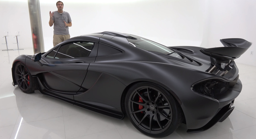

In [ ]:
download_url(urls[0], 'images/mclaren-P1.jpg')
im = Image.open('images/mclaren-P1.jpg')
im.thumbnail((256,256))
im

## transfer learning con pytorch y fastai

Empezaremos pensando que queremos que clasifique, en mi caso quiero que clasifique las imagenes en 3 categorias(Coche, moto y autobus), despues crearemos dos variables, una con la ruta de la carpeta donde se almacenaran las fotos usando la funcion `Path` y un array con los nombres de lo que vamos a buscar, en nuestro caso coche, moto y autobus.

In [ ]:
tipos_vehiculos = 'coche', 'autobus', 'moto'
path = Path('tipos_vehiculos')

Ahora ejecutaremos la siguiente celda, esta ejecucion nos creará la carpeta donde se descargaran las imagenes

In [ ]:
if not path.exists():
   path.mkdir()

Ahora ejecutaremos las siguientes lineas, dichas lineas nos descargará las imagenes con los nombres de la lista

In [ ]:
for o in tipos_vehiculos:
  dest = (path/o)
  dest.mkdir(exist_ok=True)
  results = search_images_ddg(f'{o} exterior', max_images=100)
  cont = 0
  for i in results:
    try:
      download_url(i, str(dest) + "/" + str(o) + str(cont) + ".jpg", timeout=30)
    except:
      print('no se ha descargado la foto del enlace '  + i)
    cont += 1

no se ha descargado la foto del enlace https://www.consejosparamihuerto.com/wp-content/uploads/2020/03/pergolas-para-coche.jpg


no se ha descargado la foto del enlace https://www.custombus.com.au/wp-content/uploads/2020/09/Portfolio-Endeavour-1.jpg


Ahora cargaremos las imagenes y verificaremos las imagenes, para ello usaremos `get_image_files`, esto cargara en una variable la ruta de cada imagen. Despues usaremos `verify_images` para comprobar si esta dañada o no, esto nos devolvera una lista de todas las imagenes que estan corruptas.








In [ ]:
ruta_imagenes = get_image_files(path)
verificacion_imagenes = verify_images(ruta_imagenes)

In [ ]:
verificacion_imagenes

(#4) [Path('tipos_vehiculos/moto/moto78.jpg'),Path('tipos_vehiculos/moto/moto18.jpg'),Path('tipos_vehiculos/autobus/autobus27.jpg'),Path('tipos_vehiculos/autobus/autobus86.jpg')]

Una vez almacenado las fotos corruptas, vamos a desvincularlas del dataset

In [ ]:
verificacion_imagenes.map(Path.unlink);

Una vez eliminado las imagenes defectuosas, utilizaremos una funcion llamada ```DataBlock```. Esta funcion nos crea una plantilla para nuestros datos, similar a un pipeline para preprocesar los datos antes de pasarselos al modelo. almacena en memoria los objetos a utilizar por el modelo, en nuestro caso las imagenes anteriormente descargadas y la categoria a la que pertenecen cada una de ellas, tambien nos dividirá los datos en entrenamiento y validacion y nos reescalará la foto para que todas tengan el mismo tamaño

In [ ]:
vehiculos = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

Vinculamos la plantilla a nuestro dataset, 

In [ ]:
dls = vehiculos.dataloaders(path)

Mostramos las imagenes del bloque de validacion

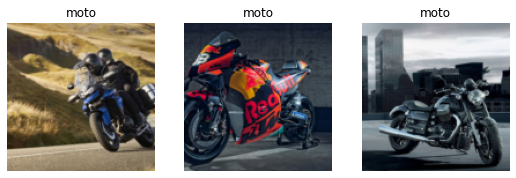

In [ ]:
dls.valid.show_batch(max_n=3, nrows=1)

Podemos realizarle algunas modificaciones, podemos reescalarlo, añadir margenes, estirar/reducir la foto, para ello utilizamos los metodos de estas dos celdas

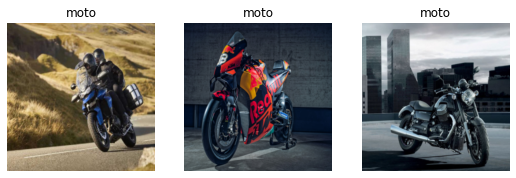

In [ ]:
vehiculos = vehiculos.new(item_tfms=Resize(256, ResizeMethod.Squish))
dls = vehiculos.dataloaders(path)
dls.valid.show_batch(max_n=3, nrows=1)

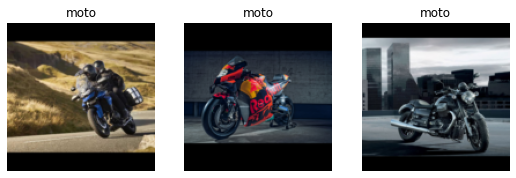

In [ ]:
vehiculos = vehiculos.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = vehiculos.dataloaders(path)
dls.valid.show_batch(max_n=3, nrows=1)

Mostramos las imagenes de entrenamiento

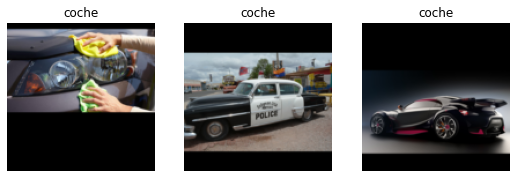

In [ ]:
dls.train.show_batch(max_n=3, nrows=1)

Para efectiva prediccion vamos a recortar las imagenes por distintos lados, es efectivo ya que nos servira para que identifique algun objeto sin que aparezca por completo.
Para ello usaremos la funcion ```RandomResizedCrop``` con el parametro ```min_scale``` ya que dicho parametro determina qué parte de la imagen selecciona como mínimo cada vez.

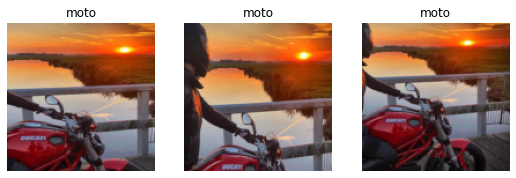

In [ ]:
vehiculos = vehiculos.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = vehiculos.dataloaders(path)
dls.train.show_batch(max_n=3, nrows=1, unique=True)

Ahora usaremos la funcion ```aug_transforms``` para crear variaciones aleatorias en nuestros datos, de manera que parecen diferentes pero realmente son las mismas. Para usar la funcion anteriormente mencionada hay que introducirla en el parametro ```batch_tfms```.

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1023: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  ret = func(*args, **kwargs)


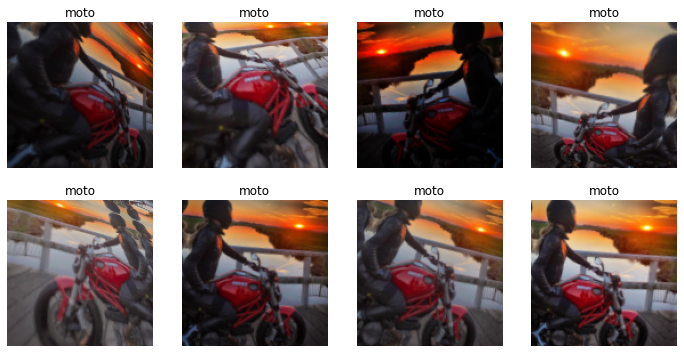

In [ ]:
vehiculos = vehiculos.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = vehiculos.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

Una vez visto lo que realiza cada linea de preprocesamiento, vamos a unificarlo en una misma ejecucucion.
En este bloque de codigo realizaremos el reescalado de todas a fotos a un tamaño estandar a todas, crearemos variaciones en nuestras fotos, cargaremos las imagenes descargadas en nuestro dataloader creado y por ultimo mostraremos los cambios realizados

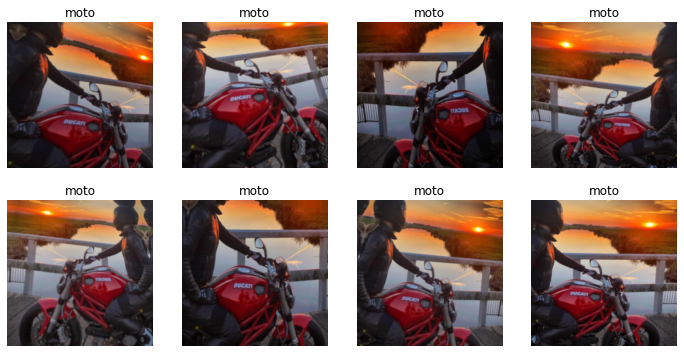

In [ ]:
vehiculos = vehiculos.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = vehiculos.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

Una vez verificado que todo este correcto, procedemos a crear nuestro modelo usando como base uno ya creado. Para ello usaremos la funcion ```cnn_learner``` donde le pasaremos los datos de entrenamiento, modelo a usar y las metricas(usaremos las de ratio de error). A continuacion, le pasaremos la funcion ```fine_tune``` para entrenar el modelo, esta funcion nos mostrara los valores de error en el dataset de entrenamiento y validacion, ratio de error y el tiempo dedicado a cada epoca

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)


In [ ]:
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.451807,0.437408,0.220000,00:13


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.519995,0.169050,0.080000,00:13
1,0.353943,0.038484,0.000000,00:13
2,0.264597,0.015165,0.000000,00:13
3,0.204128,0.014161,0.000000,00:13


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Imprimiremos una matriz de confusion para ver cuantos errores ha tendido de un vistazo

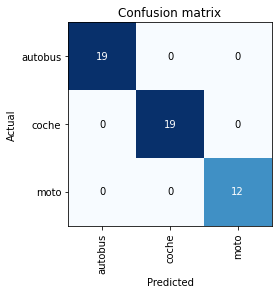

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Vemos que casi todo lo ha categorizado bien, pero hay algunas imagenes que no las ha acertado, vmaos a ver algunas de ellas...

Para ello usamos la funcion ```interp.plot_top_losses``` que nos imprimira la imagen que ha intentado predecir lo que hay y algunos valores que nos sirven para ver lo que ha predicho frente a lo que es realmente y sus porcentajes

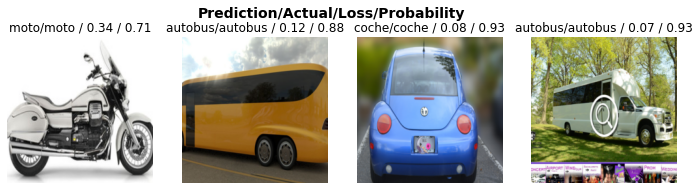

In [ ]:
interp.plot_top_losses(4, nrows=1)

Una vez visto las imagenes que ha fallado, vamos a mejorar su prediccion, para ello usaremos la funcion ```cleaner``` que nos mostrara las imagenes que tenemos dividido por conjunto(entrenamiento y validacion) y categoria(Coche, moto y bus) y un desplegable para, cambiar su etiqueta(por si en la descarga se ha guardado mal), eliminarlo del dataset o mantenerlo

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Vemos que si le introducimos la opcion (etiquetarlo diferente, mantenerlo o eliminarlo) no hace nada, es normal, para volcar los cambios ejecutaremos la linea de abajo, esta linea crea un bucle con los datos que hay en el ```cleaner``` para eliminar y lo desvincula del dataset usando la funcion ```cleaner.fns```

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

Ahora toca mover las imagenes que hemos etiquetado de manera diferente a la categoria correcta/mover la imagen de una carpeta a otra, para ello ejecutaremos la linea de abajo donde crearemos un bucle con los datos que hay en el ```cleaner``` para categorizar, usando la funcion ```shutil.move``` que nos cambiará la ubicación de las fotos que hemos cambiado su etiqueta

In [ ]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Una vez terminado este proceso, tendremos que volver a cargar el dataset(ya que se ha modificado) y entrenar nuestro modelo.

# Exportacion

Una vez ajustado nuestro modelo a nuestro gusto vamos a proceder a exportarlo, para ello usaremos la funcion ```export``` este guarda la estructura del ```DataLoader```, podria a llegar a tener cierta importancia si en algun momento deseamos cambiar la forma en la que procesamos los datos.

In [ ]:
learn.export('/content/gdrive/MyDrive/Colab Notebooks/modelos/TL_tipos_vehiculos.pkl')

Una vez exportado se generará un fichero llamado ```export.pkl```, vamos a comprobar si esta en el sistema de ficheros, para ello usaremos la funcion ```path``` con la clase ```ls```

In [ ]:
path = Path("/content/gdrive/MyDrive/Colab Notebooks/modelos")
path.ls(file_exts='.pkl')

(#1) [Path('/content/gdrive/MyDrive/Colab Notebooks/modelos/TL_tipos_vehiculos.pkl')]

Ahora vamos a realizar algunas pruebas antes de implantarlo. Empezaremos cargandolo, para ello usaremos una funcion llamada ```load_learner```

In [ ]:
learn_ext = load_learner(path/'TL_tipos_vehiculos.pkl')

Una vez cargado el modelo, le pasaremos la ruta de la imagen a predecir su etiqueta

In [ ]:
learn_ext.predict('images/coche-test.png')

('coche', tensor(1), tensor([1.6272e-05, 9.9997e-01, 1.6352e-05]))